# Chirundu Town Council CDF Community Projects - 2026

## Purpose

This notebook extracts, cleans, validates and exports approved
CDF community project information published by Chirundu Town Council.

The source PDF is scanned, therefore OCR is used to extract the text
before the records are cleaned and structured.

## Final Dataset Fields

- project_name
- ward
- year
- approval_status
- project_type

In [1]:
import os
import pymupdf
import pytesseract
import pandas as pd
import cv2
import numpy as np

from PIL import Image
from IPython.display import display

pytesseract.pytesseract.tesseract_cmd = (
    r"C:\Program Files\Tesseract-OCR\tesseract.exe"
)

print("Libraries loaded successfully.")
print("Tesseract version:", pytesseract.get_tesseract_version())

Libraries loaded successfully.
Tesseract version: 5.4.0.20240606


## Source Document

The source document is the 2026 Chirundu Town Council approved CDF
community projects PDF.

The document contains three scanned pages.

The source table contains project information such as project name,
ward, zone, location and item, but it does not contain a Sector field.

Therefore, `project_type` is derived during data curation from the
main purpose described in each project.

In [2]:
pdf_path = "raw/2026-Approved-CDF-Community-Projects.pdf"

print("File exists:", os.path.exists(pdf_path))

File exists: True


In [3]:
doc = pymupdf.open(pdf_path)

print("PDF opened successfully.")
print("Number of pages:", len(doc))

PDF opened successfully.
Number of pages: 3


## Direct Text Extraction Test

Before applying OCR, the notebook checks whether useful
machine-readable text can be extracted directly from the PDF.

Because the source consists of scanned pages, little or no useful
text is expected from direct extraction.

In [4]:
for page_number, page in enumerate(doc):
    text = page.get_text().strip()

    print(
        f"Page {page_number + 1}:",
        len(text),
        "characters detected"
    )

Page 1: 10 characters detected
Page 2: 10 characters detected
Page 3: 10 characters detected


## OCR Extraction

Each scanned page is converted to a high-resolution image and then
processed using Tesseract OCR.

The OCR output is reviewed against the original PDF because scanned
tables may produce incorrect characters, merged rows or incomplete
text.

In [5]:
os.makedirs("notebooks/2026_ocr", exist_ok=True)

image_paths = []

for i, page in enumerate(doc):
    matrix = pymupdf.Matrix(3, 3)

    pix = page.get_pixmap(
        matrix=matrix,
        alpha=False
    )

    image_path = (
        f"notebooks/2026_ocr/"
        f"2026_cdf_page{i + 1}.png"
    )

    pix.save(image_path)
    image_paths.append(image_path)

    print("Saved:", image_path)

Saved: notebooks/2026_ocr/2026_cdf_page1.png
Saved: notebooks/2026_ocr/2026_cdf_page2.png
Saved: notebooks/2026_ocr/2026_cdf_page3.png


notebooks/2026_ocr/2026_cdf_page1.png


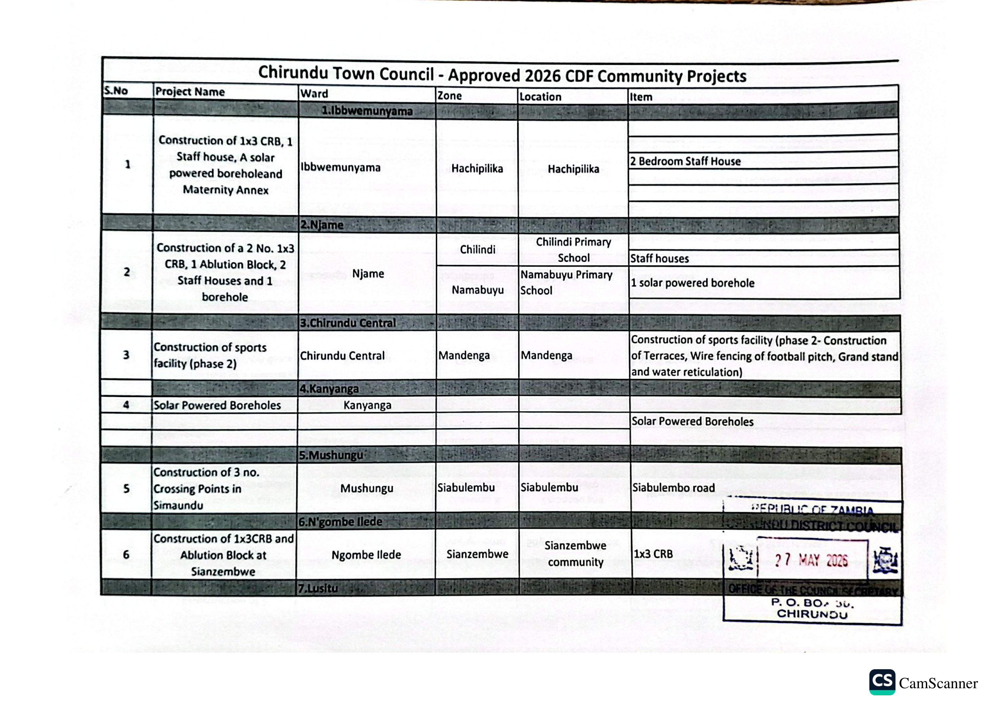

notebooks/2026_ocr/2026_cdf_page2.png


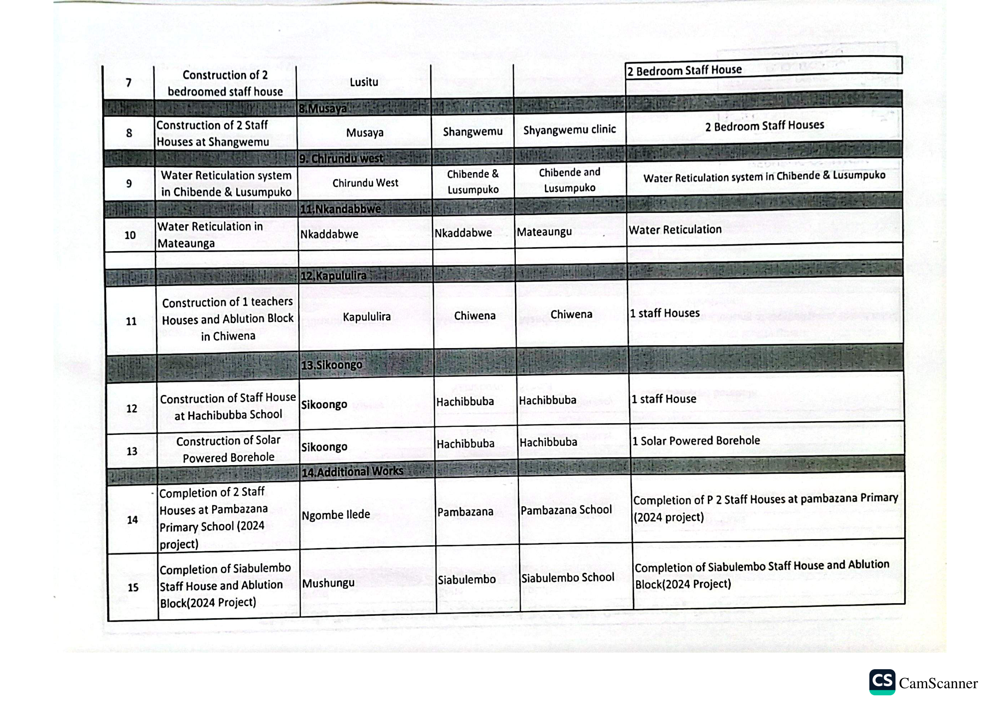

notebooks/2026_ocr/2026_cdf_page3.png


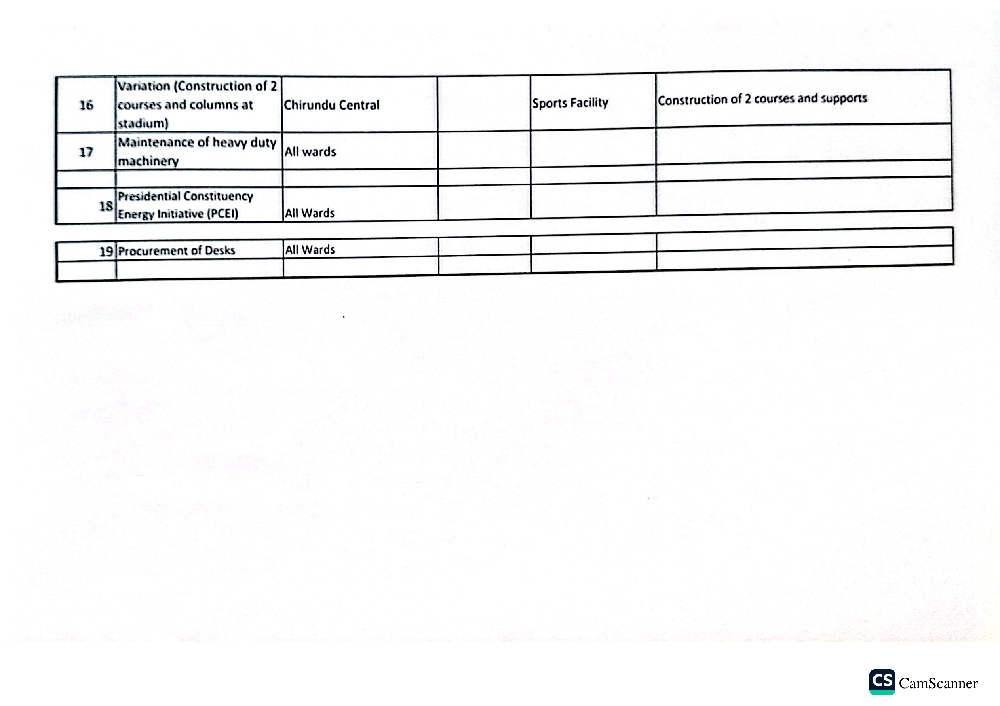

In [6]:
for image_path in image_paths:
    print(image_path)

    page_image = Image.open(image_path)
    display(page_image)

In [7]:
ocr_pages_2026 = []

for i, image_path in enumerate(image_paths):
    image = cv2.imread(image_path)

    gray = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2GRAY
    )

    ocr_text = pytesseract.image_to_string(
        gray,
        lang="eng",
        config="--psm 6"
    )

    ocr_pages_2026.append(ocr_text)

    print(f"\n--- PAGE {i + 1} ---\n")
    print(ocr_text)


--- PAGE 1 ---

—— STDS ''OYSSIFINT OO hhh
Chirundu Town Council - Approved 2026 CDF Community Projects
No [Project Name S| TERRY (RN (PR |
Construction of 1x3 CRB, 1 Pane 2 IE
Staff house, A solar sie = 2 Bedroom Staff House
powered boreholeand _[PPwemunyama See OR a cs oo eee
Maternity Annex PR en ne eee el
Construction of a 2 No. 1x3 Chilindi ST pe ial aac |
z School
CRB, 1 Ablution Block, 2 NaimabuVUlerina
Staff Houses and 1 y Y 1 solar powered borehole
Namabuyu {School
borehole
t j [3\chtrundu\Central. {i i
: Construction of sports facility (phase 2- Construction
—— east Chirundu Central Mandenga Mandenga of Terraces, Wire fencing of football pitch, Grand stand
facility (phase 2) and water reticulation)
es Se TL
as a
Construction of 3 no.
Crossing Points in Siabulembu Siabulembu Siabulembo road
Simaundu fDi IB OF 7 ann
Construction of 1x3CRB and Sianzembwe a.
. Ay .
Ablution Block at Ngombe Ilede Sianzembwe conineunity 1x3 CRB i" “it 27 MAY 20% Gu
Sianzembwe |
— P.O. BOs au.
CHIR

In [8]:
ocr_text_2026 = ""

for i, text in enumerate(ocr_pages_2026):
    ocr_text_2026 += (
        f"\nPAGE {i + 1}\n"
        + text
        + "\n"
    )

ocr_output_path = (
    "notebooks/2026_ocr/"
    "2026_ocr_raw.txt"
)

with open(
    ocr_output_path,
    "w",
    encoding="utf-8"
) as file:
    file.write(ocr_text_2026)

print("Raw OCR text saved successfully:")
print(ocr_output_path)

Raw OCR text saved successfully:
notebooks/2026_ocr/2026_ocr_raw.txt


## Data Cleaning and Curation

The OCR output was compared with the original 2026 PDF tables.

Incorrect OCR characters, merged text and incomplete entries were
corrected using the source document.

The following fields were used:

- `project_name`: extracted from the project information in the source.
- `ward`: extracted from the Ward field.
- `year`: assigned as 2026 from the source document year.
- `approval_status`: assigned as `Approved` because the source document
  contains approved CDF community projects.
- `project_type`: derived from the main purpose of each project because
  the source document does not contain a Sector field.

In [9]:
projects_2026 = [
    {
        "project_name": "Construction of 1x3 CRB, 1 Staff House, a Solar Powered Borehole and Maternity Annex",
        "ward": "Ibbwemunyama",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Education"
    },
    {
        "project_name": "Construction of 2 No. 1x3 CRB, 1 Ablution Block, 2 Staff Houses and 1 Borehole",
        "ward": "Njame",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Education"
    },
    {
        "project_name": "Construction of Sports Facility (Phase 2)",
        "ward": "Chirundu Central",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Sports"
    },
    {
        "project_name": "Solar Powered Boreholes",
        "ward": "Kanyanga",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Water"
    },
    {
        "project_name": "Construction of 3 No. Crossing Points in Simaundu",
        "ward": "Mushungu",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Infrastructure"
    },
    {
        "project_name": "Construction of 1x3 CRB and Ablution Block at Sianzenbwe",
        "ward": "Ngombe Ilede",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Education"
    },
    {
        "project_name": "Construction of 2 Bedroomed Staff House",
        "ward": "Lusitu",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Infrastructure"
    },
    {
        "project_name": "Construction of 2 Staff Houses at Shangwemu",
        "ward": "Musaya",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Health"
    },
    {
        "project_name": "Water Reticulation System in Chibende & Lusumpuko",
        "ward": "Chirundu West",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Water"
    },
    {
        "project_name": "Water Reticulation in Mateaunga",
        "ward": "Nkaddabwe",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Water"
    },
    {
        "project_name": "Construction of 1 Teachers House and Ablution Block in Chiwena",
        "ward": "Kapululira",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Education"
    },
    {
        "project_name": "Construction of Staff House at Hachibubba School",
        "ward": "Sikoongo",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Education"
    },
    {
        "project_name": "Construction of Solar Powered Borehole",
        "ward": "Sikoongo",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Water"
    },
    {
        "project_name": "Completion of 2 Staff Houses at Pambazana Primary School (2024 Project)",
        "ward": "Ngombe Ilede",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Education"
    },
    {
        "project_name": "Completion of Siabulembo Staff House and Ablution Block (2024 Project)",
        "ward": "Mushungu",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Education"
    },
    {
        "project_name": "Variation (Construction of 2 Courses and Columns at Stadium)",
        "ward": "Chirundu Central",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Sports"
    },
    {
        "project_name": "Maintenance of Heavy Duty Machinery",
        "ward": "All Wards",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Infrastructure"
    },
    {
        "project_name": "Presidential Constituency Energy Initiative (PCEI)",
        "ward": "All Wards",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Energy"
    },
    {
        "project_name": "Procurement of Desks",
        "ward": "All Wards",
        "year": 2026,
        "approval_status": "Approved",
        "project_type": "Education"
    }
]

df_2026 = pd.DataFrame(projects_2026)

display(df_2026)

,project_name,ward,year,approval_status,project_type
0,"Construction of 1x3 CRB, 1 Staff House, a Sola...",Ibbwemunyama,2026,Approved,Education
1,"Construction of 2 No. 1x3 CRB, 1 Ablution Bloc...",Njame,2026,Approved,Education
2,Construction of Sports Facility (Phase 2),Chirundu Central,2026,Approved,Sports
3,Solar Powered Boreholes,Kanyanga,2026,Approved,Water
4,Construction of 3 No. Crossing Points in Simaundu,Mushungu,2026,Approved,Infrastructure
5,Construction of 1x3 CRB and Ablution Block at ...,Ngombe Ilede,2026,Approved,Education
6,Construction of 2 Bedroomed Staff House,Lusitu,2026,Approved,Infrastructure
7,Construction of 2 Staff Houses at Shangwemu,Musaya,2026,Approved,Health
8,Water Reticulation System in Chibende & Lusumpuko,Chirundu West,2026,Approved,Water
9,Water Reticulation in Mateaunga,Nkaddabwe,2026,Approved,Water


## Data Validation

The cleaned dataset is checked for:

- expected number of project records
- correct column structure
- missing values
- duplicate records
- year consistency
- approval status consistency
- project types
- ward values

In [10]:
print("Dataset shape:", df_2026.shape)

print("\nColumns:")
print(df_2026.columns.tolist())

print("\nMissing values:")
print(df_2026.isnull().sum())

print("\nDuplicate rows:")
print(df_2026.duplicated().sum())

print("\nYear values:")
print(df_2026["year"].value_counts())

print("\nApproval status:")
print(df_2026["approval_status"].value_counts())

print("\nProject types:")
print(df_2026["project_type"].value_counts())

print("\nWards:")
print(df_2026["ward"].value_counts())

Dataset shape: (19, 5)

Columns:
['project_name', 'ward', 'year', 'approval_status', 'project_type']

Missing values:
project_name       0
ward               0
year               0
approval_status    0
project_type       0
dtype: int64

Duplicate rows:
0

Year values:
year
2026    19
Name: count, dtype: int64

Approval status:
approval_status
Approved    19
Name: count, dtype: int64

Project types:
project_type
Education         8
Water             4
Infrastructure    3
Sports            2
Health            1
Energy            1
Name: count, dtype: int64

Wards:
ward
All Wards           3
Chirundu Central    2
Mushungu            2
Ngombe Ilede        2
Sikoongo            2
Ibbwemunyama        1
Njame               1
Kanyanga            1
Lusitu              1
Musaya              1
Chirundu West       1
Nkaddabwe           1
Kapululira          1
Name: count, dtype: int64


In [11]:
expected_columns = [
    "project_name",
    "ward",
    "year",
    "approval_status",
    "project_type"
]

if list(df_2026.columns) == expected_columns:
    print("Column structure is correct.")
else:
    print("Column structure needs correction.")

Column structure is correct.


## Project Type Classification Review

The 2026 source document does not contain a Sector field.

Therefore, `project_type` was derived from the main purpose described
in each project.

For projects containing more than one activity, classification was
based on the dominant purpose or institution associated with the
project.

This field should therefore be interpreted as a curated classification
rather than a value directly extracted from the source document.

In [12]:
classification_review = df_2026[
    [
        "project_name",
        "project_type"
    ]
]

display(classification_review)

,project_name,project_type
0,"Construction of 1x3 CRB, 1 Staff House, a Sola...",Education
1,"Construction of 2 No. 1x3 CRB, 1 Ablution Bloc...",Education
2,Construction of Sports Facility (Phase 2),Sports
3,Solar Powered Boreholes,Water
4,Construction of 3 No. Crossing Points in Simaundu,Infrastructure
5,Construction of 1x3 CRB and Ablution Block at ...,Education
6,Construction of 2 Bedroomed Staff House,Infrastructure
7,Construction of 2 Staff Houses at Shangwemu,Health
8,Water Reticulation System in Chibende & Lusumpuko,Water
9,Water Reticulation in Mateaunga,Water


## Export Final Dataset

The cleaned dataset is exported in CSV format using the pipe character
`|` as the column separator.

The filename follows the required dataset naming convention.

In [13]:
os.makedirs("processed", exist_ok=True)

output_path = (
    "processed/"
    "db-unza26-csc4792-chirundu_cdf_projects_2026.csv"
)

df_2026.to_csv(
    output_path,
    sep="|",
    index=False,
    encoding="utf-8"
)

print("Dataset exported successfully:")
print(output_path)

Dataset exported successfully:
processed/db-unza26-csc4792-chirundu_cdf_projects_2026.csv


In [14]:
final_check = pd.read_csv(
    output_path,
    sep="|"
)

print("Rows:", len(final_check))
print("Columns:", len(final_check.columns))

display(final_check)

Rows: 19
Columns: 5


,project_name,ward,year,approval_status,project_type
0,"Construction of 1x3 CRB, 1 Staff House, a Sola...",Ibbwemunyama,2026,Approved,Education
1,"Construction of 2 No. 1x3 CRB, 1 Ablution Bloc...",Njame,2026,Approved,Education
2,Construction of Sports Facility (Phase 2),Chirundu Central,2026,Approved,Sports
3,Solar Powered Boreholes,Kanyanga,2026,Approved,Water
4,Construction of 3 No. Crossing Points in Simaundu,Mushungu,2026,Approved,Infrastructure
5,Construction of 1x3 CRB and Ablution Block at ...,Ngombe Ilede,2026,Approved,Education
6,Construction of 2 Bedroomed Staff House,Lusitu,2026,Approved,Infrastructure
7,Construction of 2 Staff Houses at Shangwemu,Musaya,2026,Approved,Health
8,Water Reticulation System in Chibende & Lusumpuko,Chirundu West,2026,Approved,Water
9,Water Reticulation in Mateaunga,Nkaddabwe,2026,Approved,Water


In [15]:
print("Final verification")

print(
    "Same number of rows:",
    len(final_check) == len(df_2026)
)

print(
    "Same columns:",
    list(final_check.columns) == list(df_2026.columns)
)

print(
    "Missing values:",
    final_check.isnull().sum().sum()
)

print(
    "Duplicates:",
    final_check.duplicated().sum()
)

Final verification
Same number of rows: True
Same columns: True
Missing values: 0
Duplicates: 0


## Conclusion

The 2026 Chirundu Town Council approved CDF community projects were
successfully extracted, cleaned, structured and validated.

The source document contained three scanned pages and the final dataset
contains 19 project records and 5 fields.

The `project_name` and `ward` fields were obtained from the source
document, while `year` and `approval_status` were derived from the
document context.

Because the source does not contain a Sector field, `project_type` was
derived from the main purpose of each project.

The final CSV was exported using the required pipe (`|`) separator and
read back into Pandas to verify the output.